In [1]:
import pandas as pd
import numpy as np 
import requests 
import json
import re 
import pprint



In [2]:
import matplotlib.pyplot as plt 
import descartes
import geopandas 
from shapely.geometry import Point, Polygon
%matplotlib inline

In [3]:
from config import nasa_api

In [358]:
# %pip install descartes 

In [359]:
# %pip install geopandas

In [4]:
print(nasa_api)

rPWx2mJvXdp47nosNijgDwt9U4g4q7OonmRfeNm8


In [5]:
base_url = 'https://eonet.sci.gsfc.nasa.gov/api/v2.1/events'
link = 'link'
api_format = 'json'

In [6]:
# query_url = f"{url}appid={api_key}&units={units}&q="
event_response = requests.get(f'{base_url}?format={api_format}&api_key={nasa_api}').json()

In [7]:
# print(event_response['events'][1:10])
print(json.dumps(event_response['events'][1:10], indent = 2))

[
  {
    "id": "EONET_5165",
    "title": "Tropical Cyclone Gati",
    "description": "",
    "link": "https://eonet.sci.gsfc.nasa.gov/api/v2.1/events/EONET_5165",
    "categories": [
      {
        "id": 10,
        "title": "Severe Storms"
      }
    ],
    "sources": [
      {
        "id": "GDACS",
        "url": "https://www.gdacs.org/Cyclones/report.aspx?eventid=1000746&amp;eventtype=TC"
      },
      {
        "id": "JTWC",
        "url": "https://www.metoc.navy.mil/jtwc/products/io0320.tcw"
      }
    ],
    "geometries": [
      {
        "date": "2020-11-21T18:00:00Z",
        "type": "Point",
        "coordinates": [
          55.5,
          10.8
        ]
      },
      {
        "date": "2020-11-22T00:00:00Z",
        "type": "Point",
        "coordinates": [
          53.8,
          10.6
        ]
      },
      {
        "date": "2020-11-22T06:00:00Z",
        "type": "Point",
        "coordinates": [
          52.5,
          10.3
        ]
      },
      {
     

In [8]:
# list_of_events = []

# for event in event_response['events']:
#     # print(f'this is the event key: {event}')
#     # print(f' this is the event value: {event_response[event]}')
#     # event_details = event_response['events']
#     # for x in event_details:
        
#     id=event['id']
#     title=event['title']
#     coords=event['geometries'][0]['coordinates']
#     date=event['geometries'][0]['date']
    
#     # longitude=event['geometries'][0]['coordinates'][1]

#     event_dict = {
#         'id': id,
#         'title':title,
#         'date' : date,
#         'coords': coords
        
#     }

#     list_of_events.append(event_dict)
    
# # print(list_of_events)
# print(json.dumps(list_of_events, indent = 2))


In [9]:
# type_id = event['categories']

In [10]:
list_of_events = []

for event in event_response['events']:
    # print(f'this is the event key: {event}')
    # print(f' this is the event value: {event_response[event]}')
    # event_details = event_response['events']
    # for x in event_details:
    
    id=event['id']
    title=event['title']
    type_id = event['categories'][0]['id']
    type_title = event['categories'][0]['title']
    coords=event['geometries'][0]['coordinates']
    geo_type =  event['geometries'][0]['type']
    date=event['geometries'][0]['date']
    if not geo_type == 'Point':
        continue
    # longitude=event['geometries'][0]['coordinates'][1]

    event_dict = {
        'id': id,
        'title':title,
        'type_id': type_id,
        'type_title': type_title,
        'date' : date,
        'coords': coords,
        'geo_type': geo_type,
        

        
    }

    list_of_events.append(event_dict)
    
# print(list_of_events)
print(json.dumps(list_of_events, indent = 2))

[
  {
    "id": "EONET_5167",
    "title": "Tropical Cyclone Nivar",
    "type_id": 10,
    "type_title": "Severe Storms",
    "date": "2020-11-23T12:00:00Z",
    "coords": [
      83.8,
      9.8
    ],
    "geo_type": "Point"
  },
  {
    "id": "EONET_5165",
    "title": "Tropical Cyclone Gati",
    "type_id": 10,
    "type_title": "Severe Storms",
    "date": "2020-11-21T18:00:00Z",
    "coords": [
      55.5,
      10.8
    ],
    "geo_type": "Point"
  },
  {
    "id": "EONET_5162",
    "title": "Wildfire - SE of Parowan, Utah - United States",
    "type_id": 8,
    "type_title": "Wildfires",
    "date": "2020-11-19T09:40:00Z",
    "coords": [
      -112.682747893,
      37.600131437
    ],
    "geo_type": "Point"
  },
  {
    "id": "EONET_5163",
    "title": "Wildfires - Washoe County (Pinehaven Fire), Nevada, United States",
    "type_id": 8,
    "type_title": "Wildfires",
    "date": "2020-11-18T13:59:00Z",
    "coords": [
      -119.86343,
      39.46996
    ],
    "geo_type": 

In [11]:
df=pd.DataFrame(list_of_events)
df

,id,title,type_id,type_title,date,coords,geo_type
0,EONET_5167,Tropical Cyclone Nivar,10,Severe Storms,2020-11-23T12:00:00Z,"[83.8, 9.8]",Point
1,EONET_5165,Tropical Cyclone Gati,10,Severe Storms,2020-11-21T18:00:00Z,"[55.5, 10.8]",Point
2,EONET_5162,"Wildfire - SE of Parowan, Utah - United States",8,Wildfires,2020-11-19T09:40:00Z,"[-112.682747893, 37.600131437]",Point
3,EONET_5163,"Wildfires - Washoe County (Pinehaven Fire), Ne...",8,Wildfires,2020-11-18T13:59:00Z,"[-119.86343, 39.46996]",Point
4,EONET_5159,Wildfire - S of Carson City (Mountain View Fir...,8,Wildfires,2020-11-17T21:39:00Z,"[-119.46311, 38.52867]",Point
...,...,...,...,...,...,...,...
140,EONET_2876,Iceberg C15,15,Sea and Lake Ice,2011-08-30T00:00:00Z,"[146.7084, -67.6323]",Point
141,EONET_2878,Iceberg B09B,15,Sea and Lake Ice,2011-08-30T00:00:00Z,"[143.3638, -66.366]",Point
142,EONET_2879,Iceberg D20A,15,Sea and Lake Ice,2011-08-30T00:00:00Z,"[36.9008, -69.2625]",Point
143,EONET_2997,Iceberg C21B,15,Sea and Lake Ice,2011-08-30T00:00:00Z,"[96.18, -64.9955]",Point


In [12]:
# From Chris Albon
# https://chrisalbon.com/python/data_wrangling/geocoding_and_reverse_geocoding/

In [13]:
# Create two lists for the loop results to be placed
lat = []
lon = []

# For each row in a varible,
for row in df['coords']:
    # Try to,
    try:
        # Split the row by comma, convert to float, and append
        # everything before the comma to lat
        lat.append(row[1])
        #  lat.append(float(row.split(',')[0]))
        # Split the row by comma, convert to float, and append
        # everything after the comma to lon
        lon.append(row[0])
        # lon.append(float(row.split(',')[1]))
    # But if you get an error
    except:
        # append a missing value to lat
        lat.append(np.NaN)
        # append a missing value to lon
        lon.append(np.NaN)

# Create two new columns from lat and lon
df['latitude'] = lat
df['longitude'] = lon
#Let’s take a took a what we have now.

# View the dataframe
df

,id,title,type_id,type_title,date,coords,geo_type,latitude,longitude
0,EONET_5167,Tropical Cyclone Nivar,10,Severe Storms,2020-11-23T12:00:00Z,"[83.8, 9.8]",Point,9.800000,83.800000
1,EONET_5165,Tropical Cyclone Gati,10,Severe Storms,2020-11-21T18:00:00Z,"[55.5, 10.8]",Point,10.800000,55.500000
2,EONET_5162,"Wildfire - SE of Parowan, Utah - United States",8,Wildfires,2020-11-19T09:40:00Z,"[-112.682747893, 37.600131437]",Point,37.600131,-112.682748
3,EONET_5163,"Wildfires - Washoe County (Pinehaven Fire), Ne...",8,Wildfires,2020-11-18T13:59:00Z,"[-119.86343, 39.46996]",Point,39.469960,-119.863430
4,EONET_5159,Wildfire - S of Carson City (Mountain View Fir...,8,Wildfires,2020-11-17T21:39:00Z,"[-119.46311, 38.52867]",Point,38.528670,-119.463110
...,...,...,...,...,...,...,...,...,...
140,EONET_2876,Iceberg C15,15,Sea and Lake Ice,2011-08-30T00:00:00Z,"[146.7084, -67.6323]",Point,-67.632300,146.708400
141,EONET_2878,Iceberg B09B,15,Sea and Lake Ice,2011-08-30T00:00:00Z,"[143.3638, -66.366]",Point,-66.366000,143.363800
142,EONET_2879,Iceberg D20A,15,Sea and Lake Ice,2011-08-30T00:00:00Z,"[36.9008, -69.2625]",Point,-69.262500,36.900800
143,EONET_2997,Iceberg C21B,15,Sea and Lake Ice,2011-08-30T00:00:00Z,"[96.18, -64.9955]",Point,-64.995500,96.180000


In [14]:
#from: 
# geopandas documentation https://geopandas.org/gallery/plotting_basemap_background.html#sphx-glr-gallery-plotting-basemap-background-py
#https://towardsdatascience.com/geopandas-101-plot-any-data-with-a-latitude-and-longitude-on-a-map-98e01944b972
# https://medium.com/@shakasom/how-to-convert-latitude-longtitude-columns-in-csv-to-geometry-column-using-python-4219d2106dea

In [15]:
df['geometries']=df['coords'].apply(Point)



In [16]:
# creating a geometry column 
geometry = [Point(xy) for xy in zip(df['longitude'], df['latitude'])]
# Coordinate reference system : WGS84
crs = {'init': 'epsg:4326'}
# Creating a Geographic data frame 
gdf = geopandas.GeoDataFrame(df, crs=crs, geometry=geometry)

In [17]:
geometry[:3]

In [18]:
gdf.head()

,id,title,type_id,type_title,date,coords,geo_type,latitude,longitude,geometries,geometry
0,EONET_5167,Tropical Cyclone Nivar,10,Severe Storms,2020-11-23T12:00:00Z,"[83.8, 9.8]",Point,9.800000,83.800000,POINT (83.8 9.800000000000001),POINT (83.80000 9.80000)
1,EONET_5165,Tropical Cyclone Gati,10,Severe Storms,2020-11-21T18:00:00Z,"[55.5, 10.8]",Point,10.800000,55.500000,POINT (55.5 10.8),POINT (55.50000 10.80000)
2,EONET_5162,"Wildfire - SE of Parowan, Utah - United States",8,Wildfires,2020-11-19T09:40:00Z,"[-112.682747893, 37.600131437]",Point,37.600131,-112.682748,POINT (-112.682747893 37.600131437),POINT (-112.68275 37.60013)
3,EONET_5163,"Wildfires - Washoe County (Pinehaven Fire), Ne...",8,Wildfires,2020-11-18T13:59:00Z,"[-119.86343, 39.46996]",Point,39.469960,-119.863430,POINT (-119.86343 39.46996),POINT (-119.86343 39.46996)
4,EONET_5159,Wildfire - S of Carson City (Mountain View Fir...,8,Wildfires,2020-11-17T21:39:00Z,"[-119.46311, 38.52867]",Point,38.528670,-119.463110,POINT (-119.46311 38.52867),POINT (-119.46311 38.52867)


In [19]:
gdf['type_id'].value_counts()

8     75
15    41
12    27
10     2
Name: type_id, dtype: int64

In [20]:
world_map = geopandas.read_file('countries/ne_10m_admin_0_countries.shp')

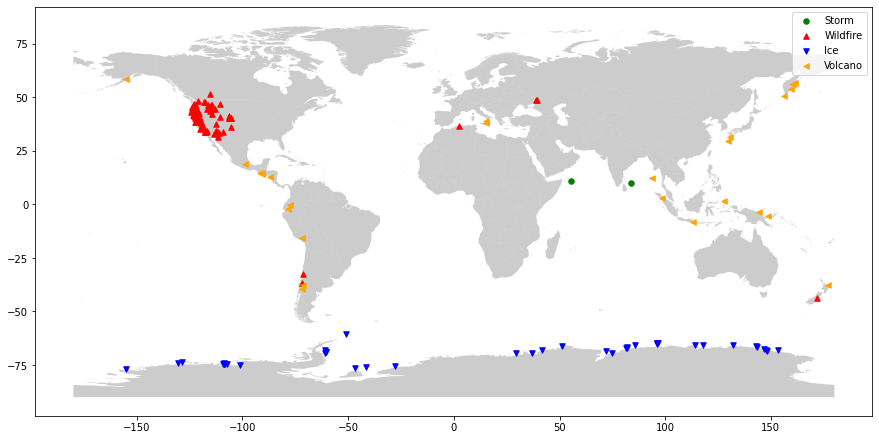

In [24]:
fig, ax = plt.subplots(figsize=(15,15))
world_map.plot(ax=ax, alpha=0.4, color='grey')
gdf[gdf['type_id']==10].plot(ax = ax, markersize=30, color='green', marker= "o", label='Storm')
gdf[gdf['type_id']==8].plot(ax = ax, markersize=30, color='red', marker= "^", label='Wildfire')
gdf[gdf['type_id']==15].plot(ax = ax, markersize=30, color='blue', marker= "v", label='Ice')
gdf[gdf['type_id']==12].plot(ax = ax, markersize=30, color='orange', marker= "<", label='Volcano')

leg = ax.legend()


In [22]:
gdf.to_csv('nasa_events.csv', index=True)